In [1]:
!pip install nengo-loihi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.1/189.1 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.5/538.5 kB 11.7 MB/s eta 0:00:00


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import imageio

def create_sparse_weights(n_pre, n_post, p, scale=0.1):
    """
    Creates a sparse weight matrix with dimensions (n_post, n_pre),
    where each edge has a probability `p` of being non-zero.

    Args:
        n_pre: Number of pre-synaptic neurons (columns).
        n_post: Number of post-synaptic neurons (rows).
        p: Probability of a connection between a pre- and post-synaptic neuron.
        scale: Scaling factor for the weights (default: 0.1).

    Returns:
        weights: A (n_post, n_pre) NumPy array representing the weight matrix.
    """
    # Generate a random matrix of the same shape
    random_matrix = np.random.rand(n_post, n_pre)

    # Apply probability threshold to create binary connections
    adjacency_matrix = (random_matrix < p).astype(float)

    # Scale the weights
    weights = adjacency_matrix * scale

    return weights

class TopKHebbianNode:
    def __init__(self, name, weights, k, beta, n_neurons):
        self.name = name
        self.weights = weights.copy()  # Initialize weights
        self.k = k
        self.beta = beta
        self.n_neurons = n_neurons
        self.previous_activity = np.zeros(self.n_neurons)
        # Store initial total incoming weights for each neuron
        self.total_incoming_weights = np.sum(self.weights, axis=1)

        self.i = 0

    def __call__(self, t, x):
        # t: Current time
        # x: Spiking activity from ensemble.neurons (binary vector)

        # **Multiplicative Hebbian Learning Update**
        # Create a mask where pre-neuron fired at t-1, post-neuron fires at t, and connection exists
        pre_fired = self.previous_activity > 0  # Neurons that fired at t-1
        post_fired = x > 0  # Neurons that fire at t
        # Outer product to find all (i, j) pairs
        firing_pairs = np.outer(post_fired, pre_fired)  # Shape (n_neurons, n_neurons)
        # Mask for existing connections
        connection_mask = self.weights > 0
        # Combined mask
        update_mask = firing_pairs & connection_mask

        # Multiply weights by (1 + beta) where the update_mask is True
        self.weights[update_mask] *= (1 + self.beta)

        # **Renormalize weights**
        # Normalize incoming weights for each neuron j
        for j in range(self.n_neurons):
            total_weight = np.sum(self.weights[j, :])
            if total_weight > 0:
                # Normalize to maintain the initial total incoming weight
                self.weights[j, :] *= self.total_incoming_weights[j] / total_weight

        # **Top-k Inhibition Enforcement**
        # Compute the input currents based on updated weights
        inputs = np.dot(self.weights, x)

        # Select top-k neurons based on input currents
        top_k_indices = np.argsort(inputs)[-self.k:]

        # Create a mask to allow only top-k neurons to receive inputs
        mask = np.zeros_like(inputs)
        mask[top_k_indices] = 1

        # Apply the mask to inputs
        inputs = inputs * mask

        # Update previous activity for the next timestep
        self.previous_activity = x.copy()

        # (Optional) Visualize adjacency matrix as heatmap
        plt.imshow(self.weights, cmap='hot', interpolation='nearest')
        plt.title(f'{self.name} Synaptic Weights Heatmap')
        plt.colorbar()
        plt.show()
        # plt.clf()

        # (Optional) Visualize neurons as directed graph
        # neurons = nx.from_numpy_array(self.weights, create_using=nx.DiGraph)
        # pos = nx.spring_layout(neurons)
        # nx.draw(neurons, pos, node_size=50, with_labels=False)
        # plt.title('Neural Network Graph')
        # plt.show()

        self.i += 1

        return inputs


In [3]:
import nengo
import nengo_loihi
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import heapq
import collections
import math
import types

class Area:
  """A brain area.

  Attributes:
    name: the area's name (symbolic tag).
    model: nengo.Network.
    n: number of neurons in the area.
    k: number of neurons that fire in this area.
    p: probability of connection between two nodes.
    beta: Default value for activation-`beta`.
    w: Number of neurons that has ever fired in this area.
  """
  def __init__(self, name, model, n, k, p, *,
               beta=0.05, w=0):
    """Initializes the instance.

    Args:
      name: Area name (symbolic tag), must be unique.
      n: number of neurons
      k: number of firing neurons when activated.
      p: probability of connection
      beta: default activation-beta.
      w: initial 'winner' set-size.
    """
    self.name = name
    self.n = n
    self.k = k
    self.p = p
    self.beta = beta
    self.w = w

    weights = create_sparse_weights(n, n, p)

    with model:
        # Create an ensemble of neurons
        self.ensemble = nengo.Ensemble(
            n_neurons=n,
            dimensions=1,  # Single-dimensional representation
            neuron_type=nengo.RegularSpiking(nengo.RectifiedLinear()),
        )

        # Create a Node to enforce the top-k constraint

        # Instantiate the node with initial weights, k, and learning rate
        top_k_node = TopKHebbianNode(self.name, weights, self.k, self.beta, self.n)

        # Create the Node
        self.top_k = nengo.Node(
            output=top_k_node,
            size_in=n,   # Receive input from all neurons
            size_out=n,  # Output modified inputs to neurons
        )

        # Connect ensemble.neurons to the Node
        nengo.Connection(
            self.ensemble.neurons,  # Source: neuron outputs (spikes)
            self.top_k,             # Destination: Node
            synapse=0.01,      # Synaptic filtering
        )

        # Connect the Node back to ensemble.neurons
        nengo.Connection(
            self.top_k,             # Source: Node output
            self.ensemble.neurons,  # Destination: neuron inputs
            synapse=0.01,      # Synaptic filtering
        )

        # Add a probe to record neural activities (filtered spikes)
        self.rate_probe = nengo.Probe(self.ensemble.neurons, synapse=None)

        # Add a probe to record spikes (raw spikes)
        self.spike_probe = nengo.Probe(self.ensemble.neurons, synapse=None)

  def plot_neural_activity(self, sim):
      """Plots neural activity."""
      # Plot average neural activity (from rate_probe)
      plt.figure(figsize=(10, 5))
      plt.plot(sim.trange(), sim.data[self.rate_probe].mean(axis=1))
      plt.xlabel("Time (s)")
      plt.ylabel("Average Neural Activity (Hz)")
      plt.title(f"Activity in Area '{self.name}' vs. Time")
      plt.show()

  def plot_firing_neurons(self, sim):
      """Plots the number of neurons firing at each timestep."""
      # Calculate the number of neurons firing at each timestep
      num_firing = np.sum(sim.data[self.spike_probe] > 0, axis=1)

      # Plot the number of neurons firing at each timestep
      plt.figure(figsize=(10, 5))
      plt.plot(sim.trange(), num_firing)
      plt.xlabel("Time (s)")
      plt.ylabel("Number of Neurons Firing")
      plt.title(f"Number of Neurons Firing in Area '{self.name}' vs. Time")
      plt.show()

/usr/local/lib/python3.10/dist-packages/nengo_loihi/version.py:20: UserWarning: This version of `nengo_loihi` has not been tested with your `nengo` version (4.0.0). The latest fully supported version is 3.2.0
  warnings.warn(


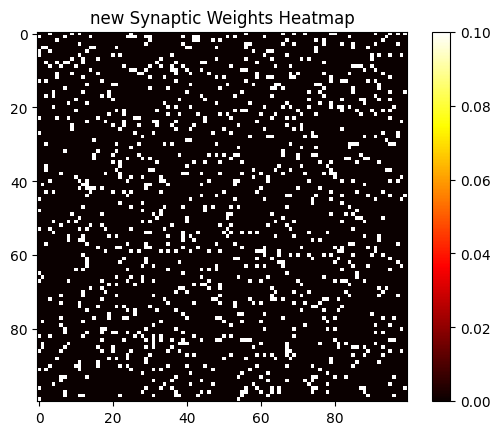

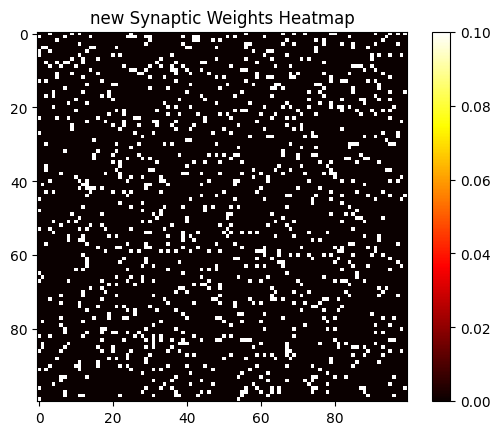

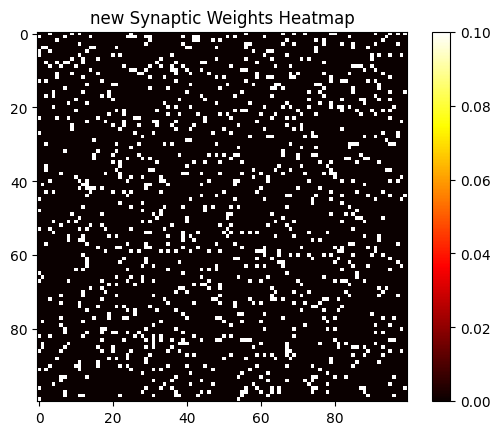

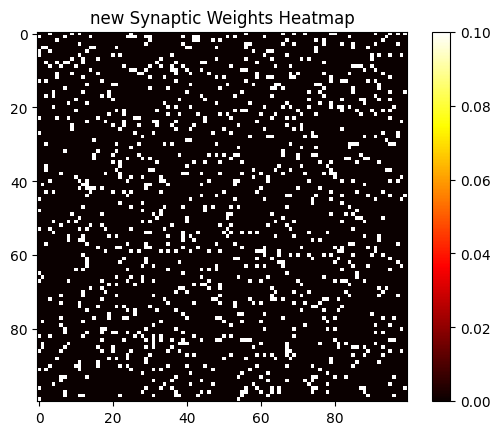

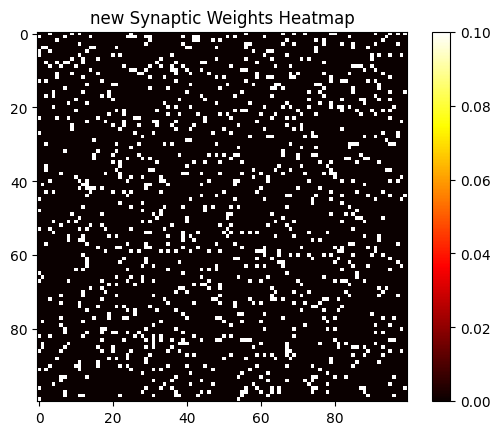

...

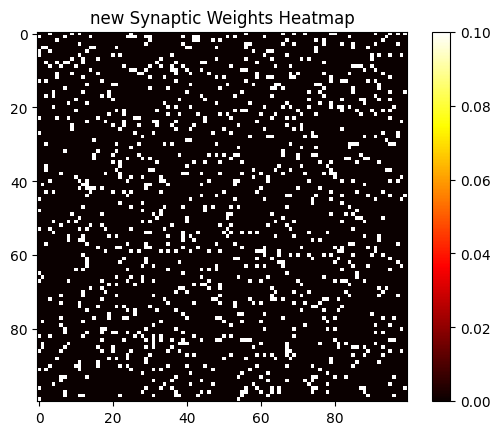

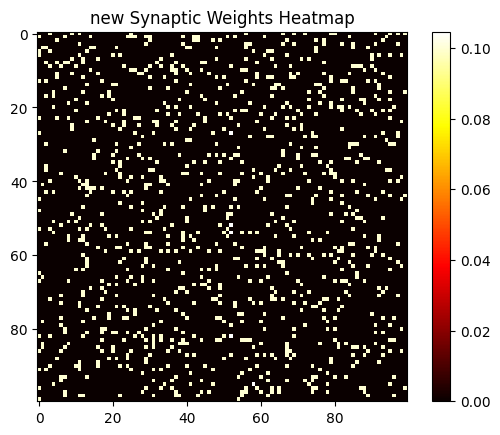

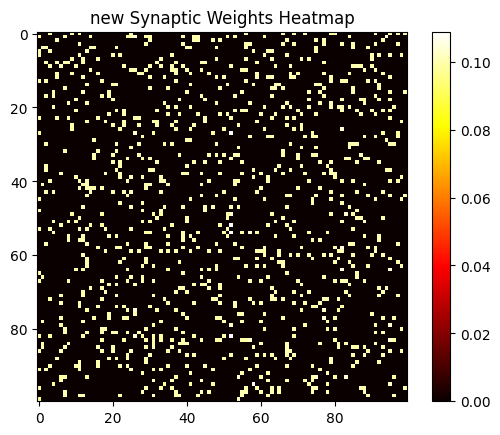

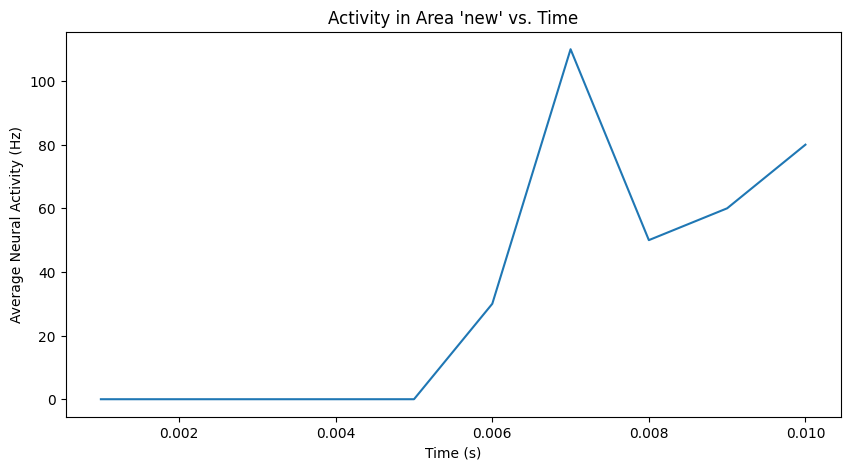

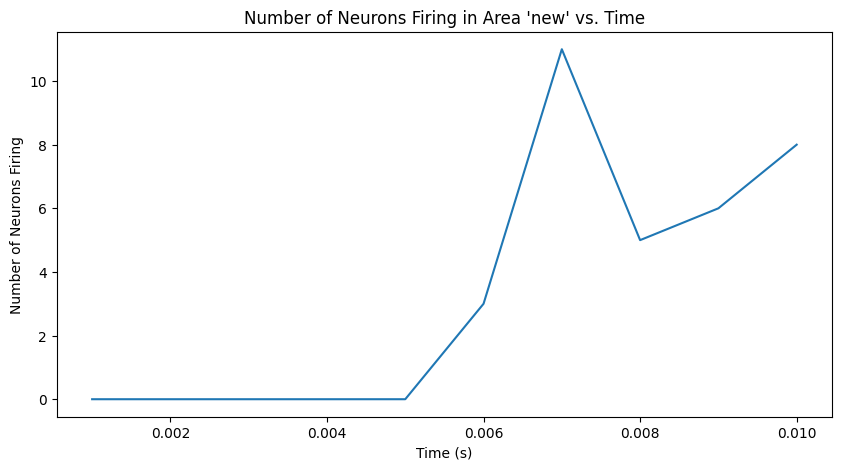

In [8]:
def test_area():
    model = nengo.Network()

    # Create a brain area
    area = Area('new', model, 100, 10, 0.1)

    # Simulate the model
    with nengo_loihi.Simulator(model) as sim:
        sim.run(0.01)  # Simulate for 0.01 second

    area.plot_neural_activity(sim)
    area.plot_firing_neurons(sim)

test_area()

In [9]:
def connect(model, area1, area2, p):
    """
    Connects two brain areas with a top-k node enforcing top-k firing and Hebbian plasticity.

    Args:
        area1: The source Area instance.
        area2: The target Area instance.
        p: Probability of connection between neurons in area1 and area2.
    """
    n_pre = area1.n  # Number of neurons in the source area
    n_post = area2.n  # Number of neurons in the target area
    k = area2.k  # Number of neurons allowed to fire in the target area
    beta = area2.beta  # Plasticity coefficient for the target area

    # Create the Erdős–Rényi graph for connections from area1 to area2
    weights = create_sparse_weights(n_pre, n_post, p)

    with model:
      # Instantiate the TopKHebbianNode for the connection
      top_k_node = TopKHebbianNode(
          name=f"{area1.name}_to_{area2.name}",
          weights=weights,
          k=k,
          beta=beta,
          n_neurons=n_post,
      )

      # Create the Node
      top_k = nengo.Node(
          output=top_k_node,
          size_in=n_pre,   # Receive input from all neurons in area1
          size_out=n_post,  # Output modified inputs to neurons in area2
      )

      # Connect area1's neurons to the TopKHebbianNode
      nengo.Connection(
          area1.ensemble.neurons,
          top_k,
          synapse=0.01,  # Synaptic filtering
      )

      # Connect the TopKHebbianNode to area2's neurons
      nengo.Connection(
          top_k,
          area2.ensemble.neurons,
          synapse=0.01,  # Synaptic filtering
      )


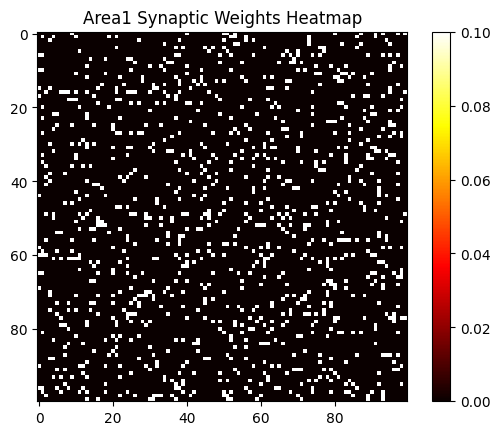

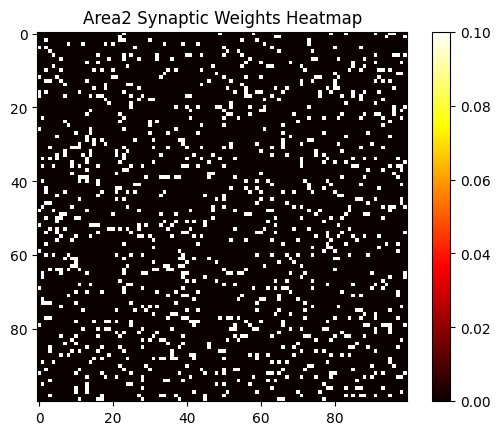

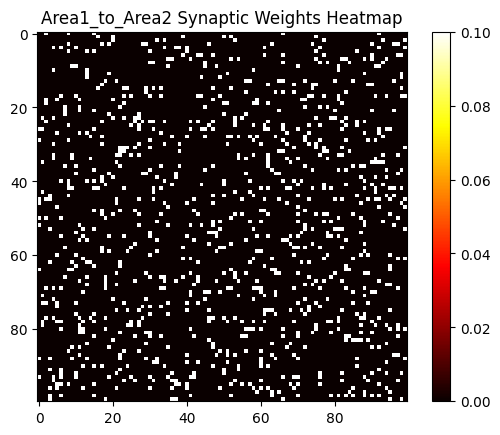

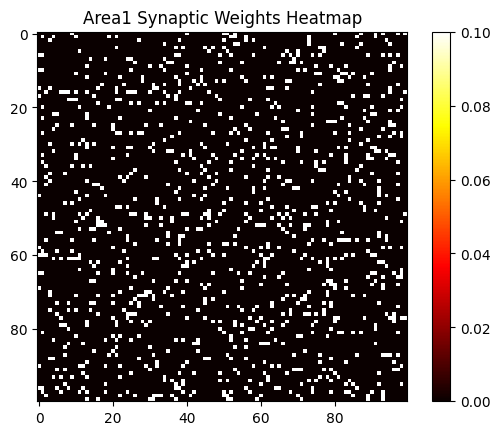

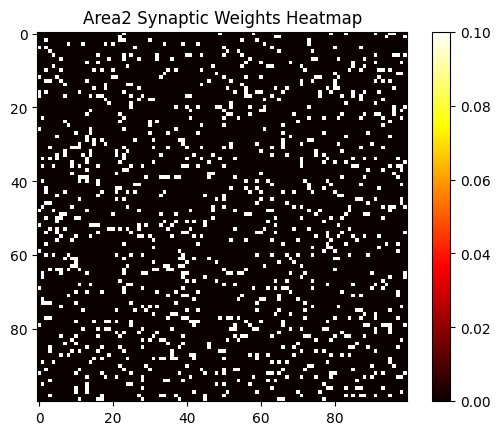

...

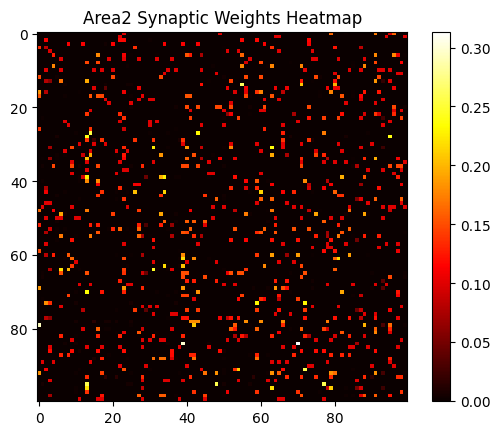

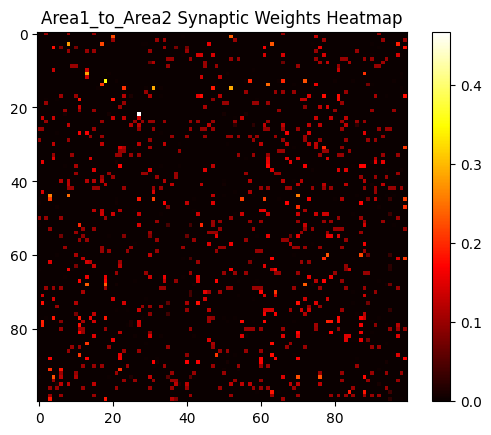

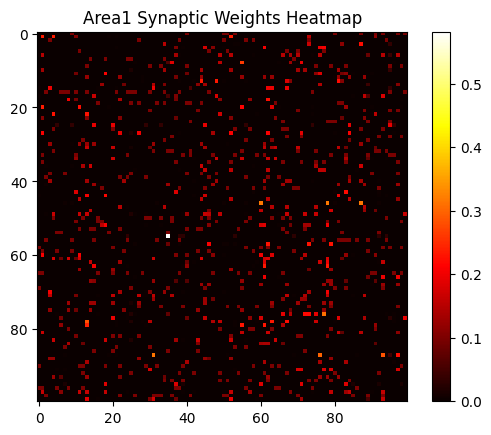

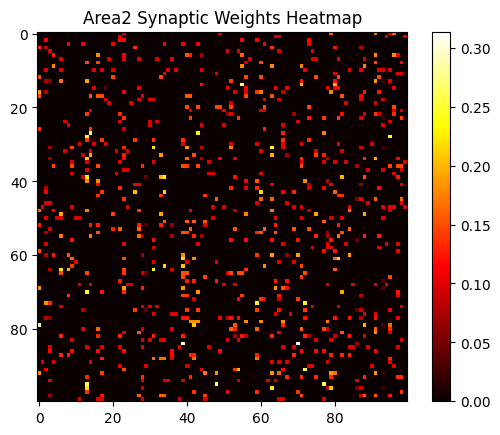

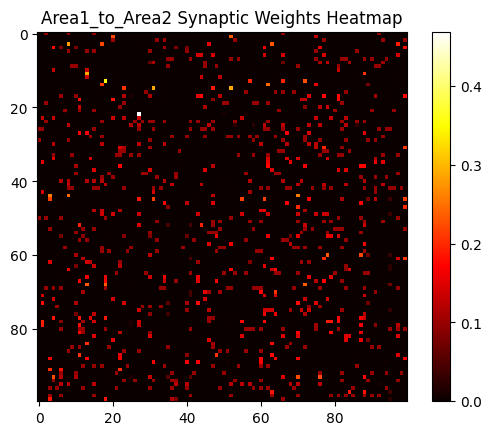

Area1 Neural Activity:


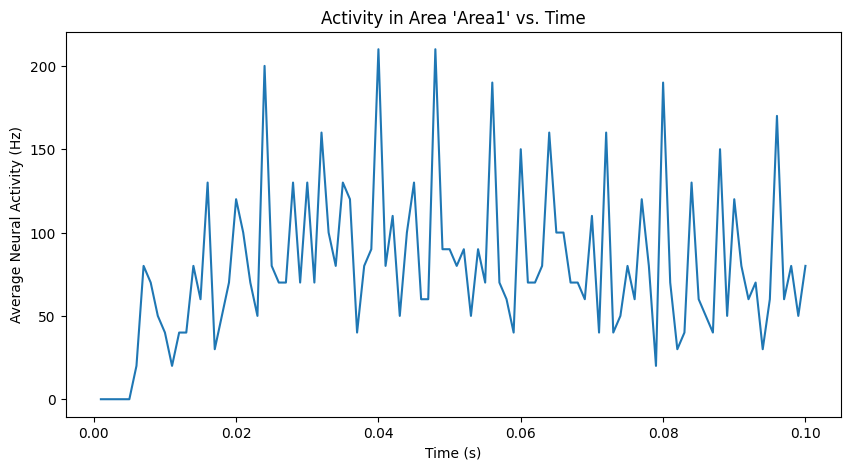

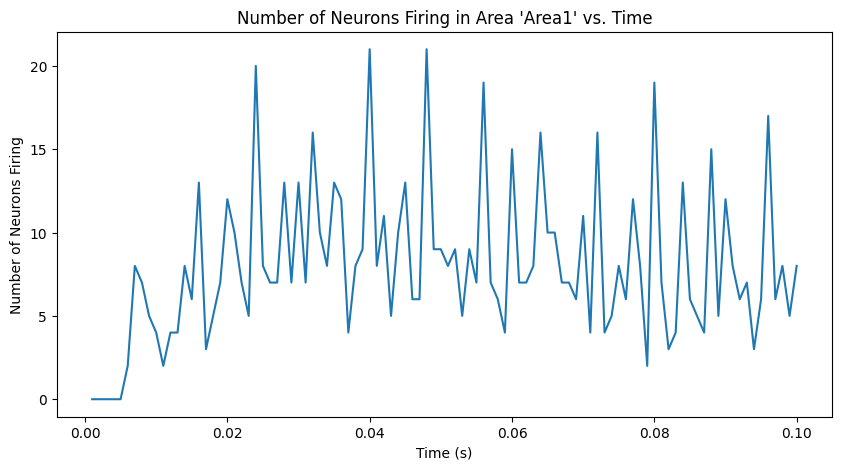

Area2 Neural Activity:


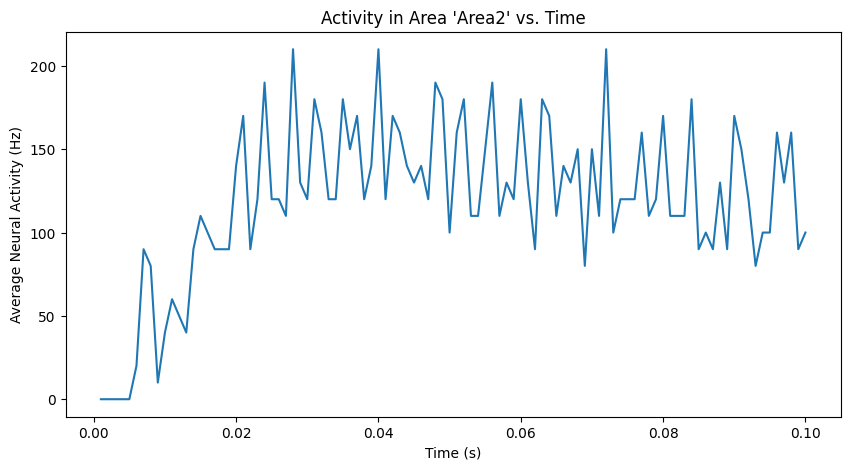

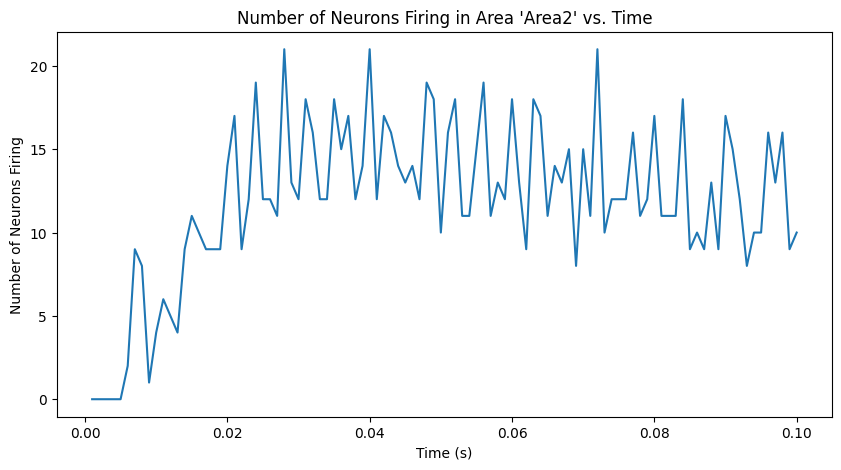

In [10]:
def test_connected_areas():
    # Create the Nengo model
    model = nengo.Network()

    # Create two brain areas
    area1 = Area('Area1', model, n=100, k=10, p=0.1)
    area2 = Area('Area2', model, n=100, k=10, p=0.1)

    # Connect area1 to area2 with a connection probability of 0.2
    connect(model, area1, area2, p=0.1)

    # Simulate the model
    with nengo_loihi.Simulator(model) as sim:
        sim.run(0.1)  # Simulate for 0.1 seconds

    # Plot neural activity and firing neurons for both areas
    print("Area1 Neural Activity:")
    area1.plot_neural_activity(sim)
    area1.plot_firing_neurons(sim)

    print("Area2 Neural Activity:")
    area2.plot_neural_activity(sim)
    area2.plot_firing_neurons(sim)

# Call the test function
test_connected_areas()
